# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

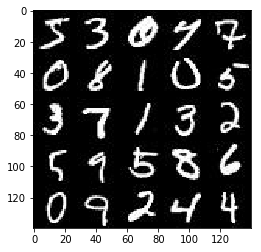

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

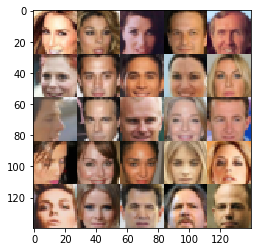

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


D:\Program Files\Anaconda3\envs\tf1.0\lib\site-packages\ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    input_z = tf.placeholder(tf.float32, shape=(None, z_dim))
    lr = tf.placeholder(tf.float32)
    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # 28x28x3
        conv1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * conv1, conv1)
        # 14x14x128        
        conv2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x256         
        # Flatten it
        flat = tf.reshape(relu2, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)        

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope("generator", reuse = not is_train):
        # dense layer
        # 7x7x256  
        d = tf.layers.dense(z, 7*7*256)
        dr = tf.reshape(d, (-1, 7, 7, 256))
        bn = tf.layers.batch_normalization(dr, training=is_train)
        relu1 = tf.maximum(alpha * bn, bn)
        # 14x14x128        
        conv = tf.layers.conv2d_transpose(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv, training=is_train)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # Output layer
        # 28x28xout_channel_dim 
        logits = tf.layers.conv2d_transpose(relu2, out_channel_dim, 5, strides=2, padding='same')               
        out = tf.tanh(logits)       
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    smooth = 0.1

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [19]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, input_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,  data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)    
    steps = 0    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2                
              
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, input_learning_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, input_learning_rate: learning_rate})

                if steps % 50 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2 Step 50... Discriminator Loss: 0.9073... Generator Loss: 2.3558


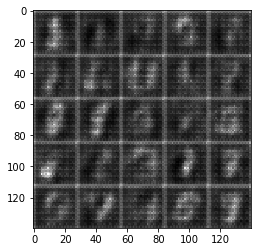

Epoch 1/2 Step 100... Discriminator Loss: 1.1264... Generator Loss: 0.8255


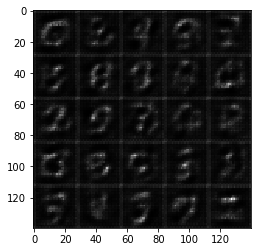

Epoch 1/2 Step 150... Discriminator Loss: 1.5194... Generator Loss: 2.0217


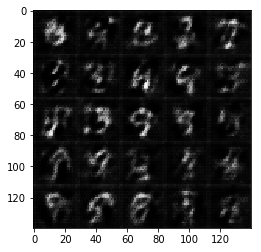

Epoch 1/2 Step 200... Discriminator Loss: 1.3066... Generator Loss: 0.7762


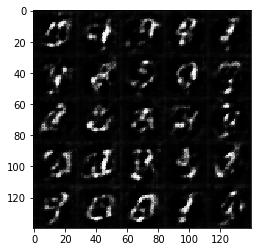

Epoch 1/2 Step 250... Discriminator Loss: 1.1652... Generator Loss: 0.8387


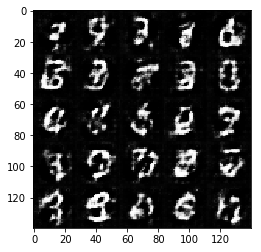

Epoch 1/2 Step 300... Discriminator Loss: 1.2104... Generator Loss: 0.6647


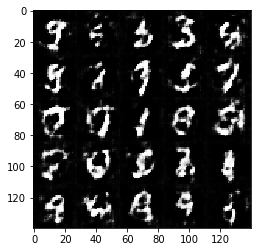

Epoch 1/2 Step 350... Discriminator Loss: 0.8584... Generator Loss: 1.3174


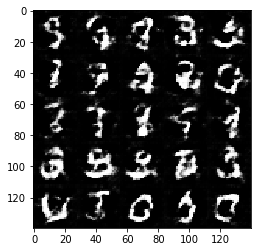

Epoch 1/2 Step 400... Discriminator Loss: 1.2875... Generator Loss: 0.6251


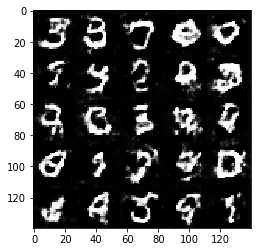

Epoch 1/2 Step 450... Discriminator Loss: 1.4352... Generator Loss: 2.5268


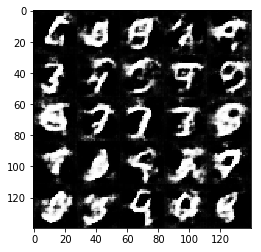

Epoch 1/2 Step 500... Discriminator Loss: 0.9629... Generator Loss: 1.3706


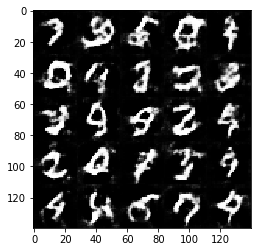

Epoch 1/2 Step 550... Discriminator Loss: 1.0625... Generator Loss: 2.1897


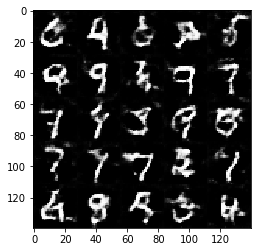

Epoch 1/2 Step 600... Discriminator Loss: 1.2899... Generator Loss: 0.6974


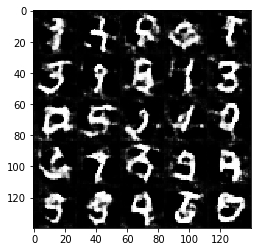

Epoch 1/2 Step 650... Discriminator Loss: 1.4184... Generator Loss: 0.5525


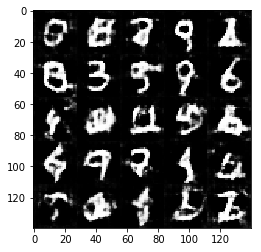

Epoch 1/2 Step 700... Discriminator Loss: 1.1041... Generator Loss: 0.9087


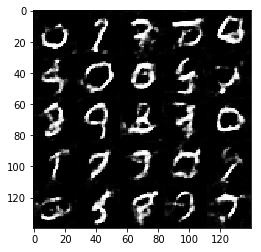

Epoch 1/2 Step 750... Discriminator Loss: 1.0097... Generator Loss: 1.6622


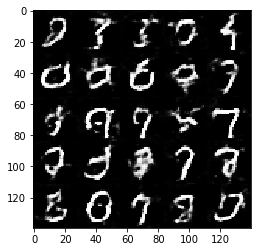

Epoch 1/2 Step 800... Discriminator Loss: 1.3331... Generator Loss: 0.7384


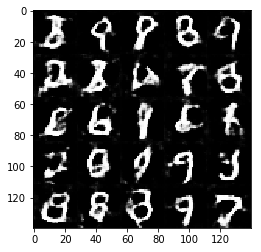

Epoch 1/2 Step 850... Discriminator Loss: 1.0975... Generator Loss: 0.8590


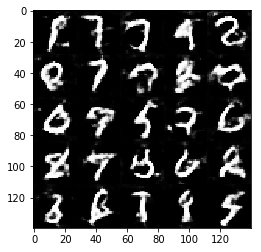

Epoch 1/2 Step 900... Discriminator Loss: 0.9884... Generator Loss: 1.1396


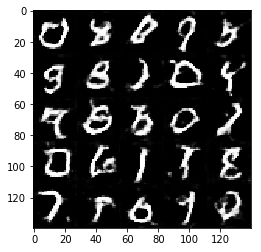

Epoch 1/2 Step 950... Discriminator Loss: 1.1285... Generator Loss: 1.1729


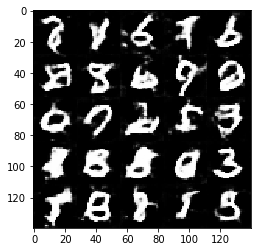

Epoch 1/2 Step 1000... Discriminator Loss: 1.2489... Generator Loss: 0.6559


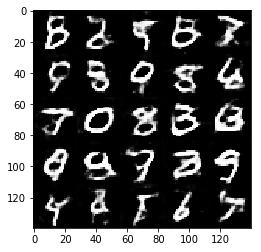

Epoch 1/2 Step 1050... Discriminator Loss: 0.9769... Generator Loss: 1.3189


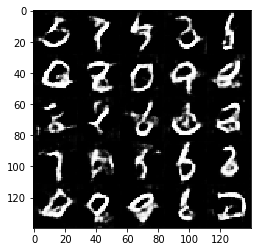

Epoch 1/2 Step 1100... Discriminator Loss: 1.0658... Generator Loss: 1.0869


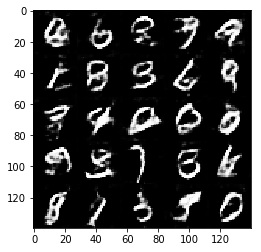

Epoch 1/2 Step 1150... Discriminator Loss: 0.9753... Generator Loss: 1.2034


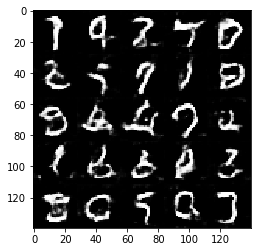

Epoch 1/2 Step 1200... Discriminator Loss: 1.1111... Generator Loss: 0.8008


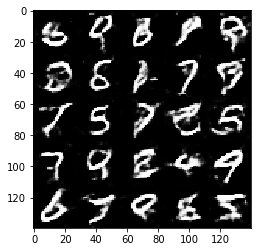

Epoch 1/2 Step 1250... Discriminator Loss: 1.0942... Generator Loss: 1.0717


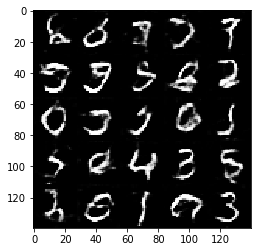

Epoch 1/2 Step 1300... Discriminator Loss: 1.3458... Generator Loss: 0.6090


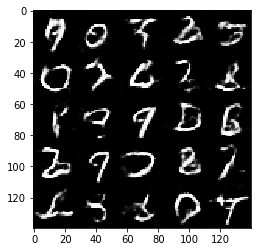

Epoch 1/2 Step 1350... Discriminator Loss: 1.0703... Generator Loss: 0.9034


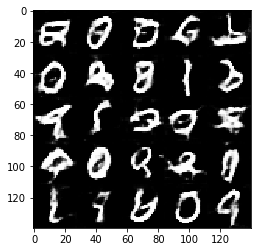

Epoch 1/2 Step 1400... Discriminator Loss: 1.3178... Generator Loss: 0.6258


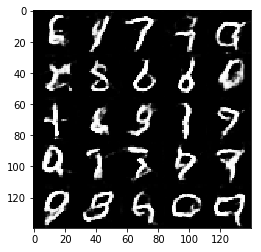

Epoch 1/2 Step 1450... Discriminator Loss: 0.8883... Generator Loss: 1.6261


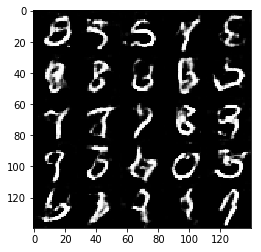

Epoch 1/2 Step 1500... Discriminator Loss: 1.3681... Generator Loss: 0.5550


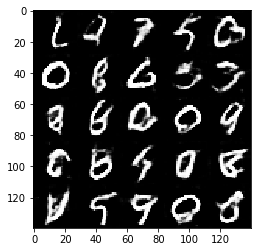

Epoch 1/2 Step 1550... Discriminator Loss: 1.2966... Generator Loss: 0.5867


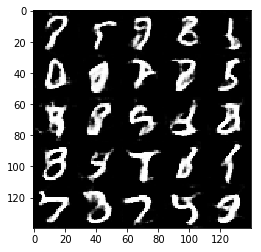

Epoch 1/2 Step 1600... Discriminator Loss: 1.0765... Generator Loss: 0.7834


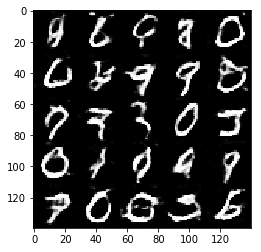

Epoch 1/2 Step 1650... Discriminator Loss: 0.7331... Generator Loss: 1.4347


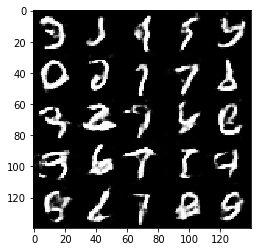

Epoch 1/2 Step 1700... Discriminator Loss: 1.0446... Generator Loss: 0.9036


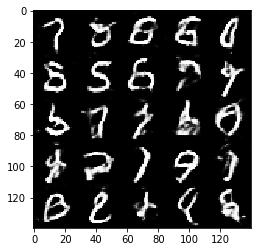

Epoch 1/2 Step 1750... Discriminator Loss: 1.1193... Generator Loss: 0.9072


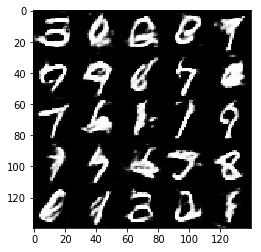

Epoch 1/2 Step 1800... Discriminator Loss: 0.7370... Generator Loss: 1.3006


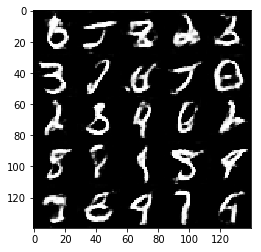

Epoch 1/2 Step 1850... Discriminator Loss: 1.4156... Generator Loss: 0.5387


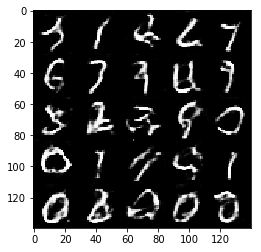

Epoch 2/2 Step 1900... Discriminator Loss: 1.1201... Generator Loss: 1.0914


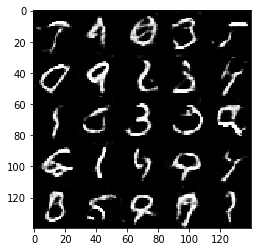

Epoch 2/2 Step 1950... Discriminator Loss: 1.1630... Generator Loss: 0.7321


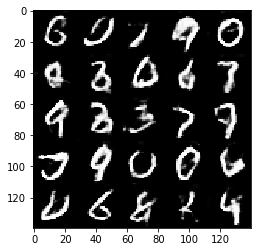

Epoch 2/2 Step 2000... Discriminator Loss: 0.8704... Generator Loss: 1.0546


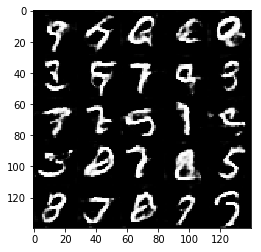

Epoch 2/2 Step 2050... Discriminator Loss: 1.0592... Generator Loss: 0.8308


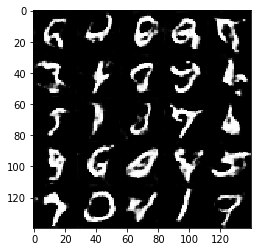

Epoch 2/2 Step 2100... Discriminator Loss: 0.8893... Generator Loss: 1.0398


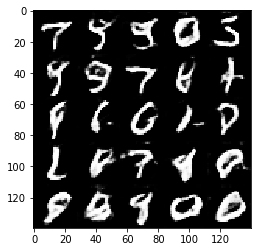

Epoch 2/2 Step 2150... Discriminator Loss: 1.5233... Generator Loss: 0.4368


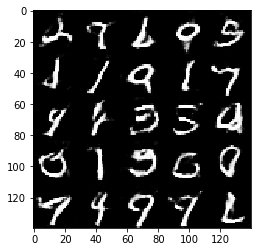

Epoch 2/2 Step 2200... Discriminator Loss: 1.3915... Generator Loss: 0.4664


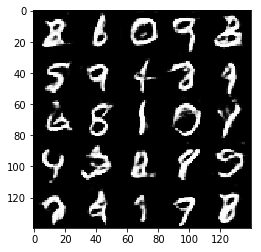

Epoch 2/2 Step 2250... Discriminator Loss: 0.9808... Generator Loss: 0.8700


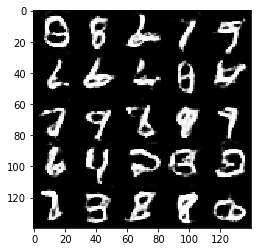

Epoch 2/2 Step 2300... Discriminator Loss: 0.9737... Generator Loss: 1.1283


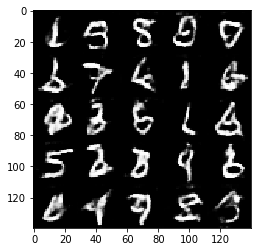

Epoch 2/2 Step 2350... Discriminator Loss: 0.7331... Generator Loss: 1.7148


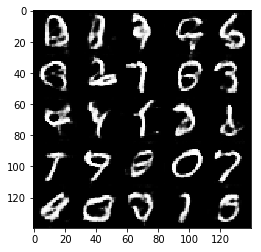

Epoch 2/2 Step 2400... Discriminator Loss: 1.0057... Generator Loss: 1.8731


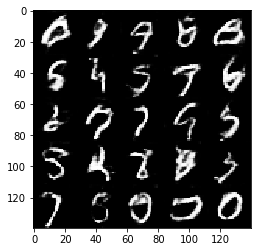

Epoch 2/2 Step 2450... Discriminator Loss: 0.9865... Generator Loss: 1.4408


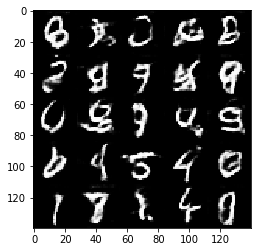

Epoch 2/2 Step 2500... Discriminator Loss: 0.9865... Generator Loss: 0.9635


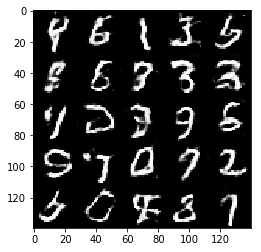

Epoch 2/2 Step 2550... Discriminator Loss: 1.1645... Generator Loss: 0.8034


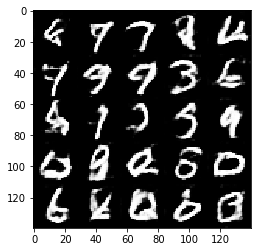

Epoch 2/2 Step 2600... Discriminator Loss: 1.1974... Generator Loss: 0.7101


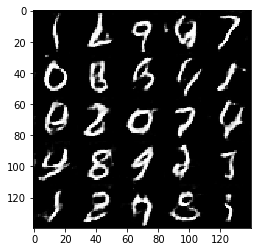

Epoch 2/2 Step 2650... Discriminator Loss: 0.9525... Generator Loss: 1.1869


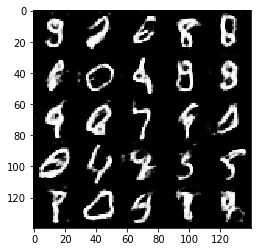

Epoch 2/2 Step 2700... Discriminator Loss: 1.0020... Generator Loss: 1.2069


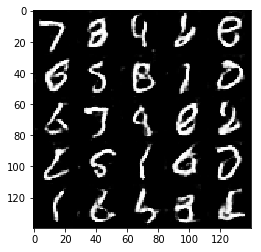

Epoch 2/2 Step 2750... Discriminator Loss: 0.7447... Generator Loss: 1.4705


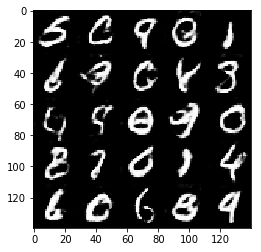

Epoch 2/2 Step 2800... Discriminator Loss: 0.9880... Generator Loss: 0.9146


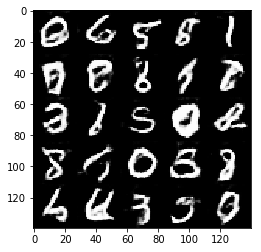

Epoch 2/2 Step 2850... Discriminator Loss: 0.7962... Generator Loss: 1.2511


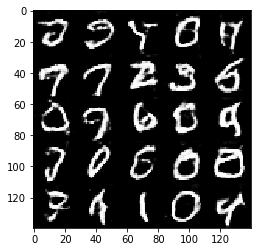

Epoch 2/2 Step 2900... Discriminator Loss: 1.0902... Generator Loss: 2.0945


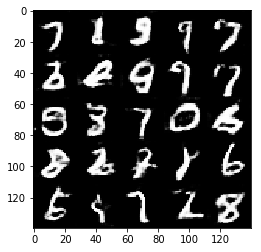

Epoch 2/2 Step 2950... Discriminator Loss: 0.9044... Generator Loss: 1.0942


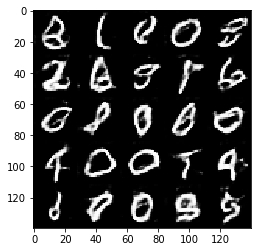

Epoch 2/2 Step 3000... Discriminator Loss: 0.7632... Generator Loss: 2.0152


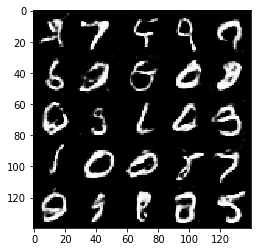

Epoch 2/2 Step 3050... Discriminator Loss: 0.8883... Generator Loss: 1.0588


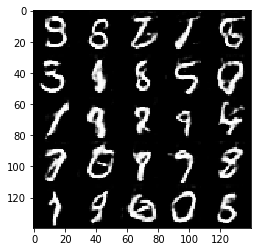

Epoch 2/2 Step 3100... Discriminator Loss: 0.8657... Generator Loss: 1.2627


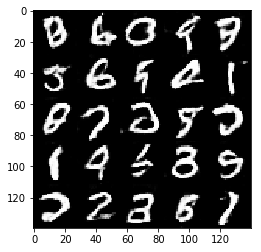

Epoch 2/2 Step 3150... Discriminator Loss: 1.2590... Generator Loss: 3.8143


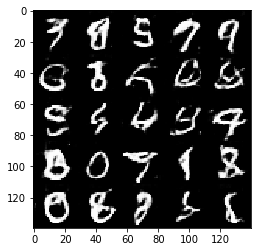

Epoch 2/2 Step 3200... Discriminator Loss: 1.0153... Generator Loss: 2.7775


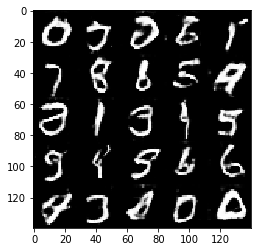

Epoch 2/2 Step 3250... Discriminator Loss: 0.6682... Generator Loss: 1.8493


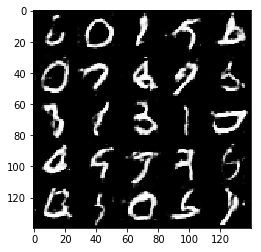

Epoch 2/2 Step 3300... Discriminator Loss: 1.9167... Generator Loss: 0.4382


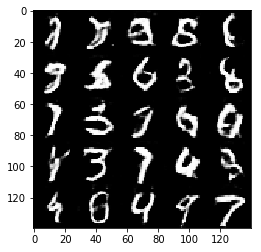

Epoch 2/2 Step 3350... Discriminator Loss: 0.9036... Generator Loss: 1.9697


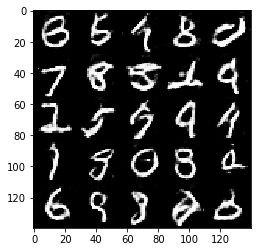

Epoch 2/2 Step 3400... Discriminator Loss: 1.1636... Generator Loss: 0.7498


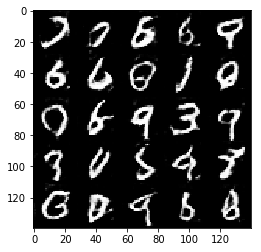

Epoch 2/2 Step 3450... Discriminator Loss: 0.8648... Generator Loss: 1.2164


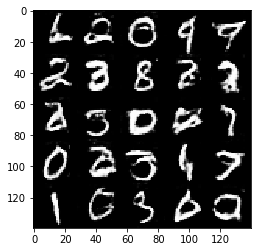

Epoch 2/2 Step 3500... Discriminator Loss: 0.6728... Generator Loss: 1.7051


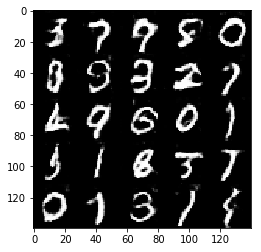

Epoch 2/2 Step 3550... Discriminator Loss: 2.1872... Generator Loss: 0.4017


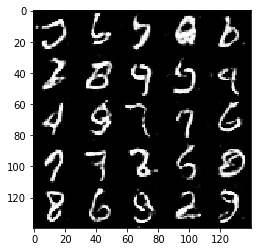

Epoch 2/2 Step 3600... Discriminator Loss: 1.1013... Generator Loss: 0.8330


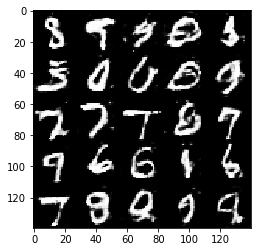

Epoch 2/2 Step 3650... Discriminator Loss: 0.6599... Generator Loss: 1.5874


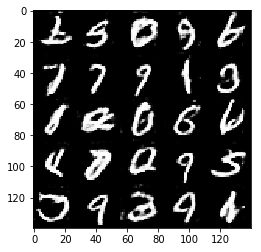

Epoch 2/2 Step 3700... Discriminator Loss: 0.9464... Generator Loss: 1.0779


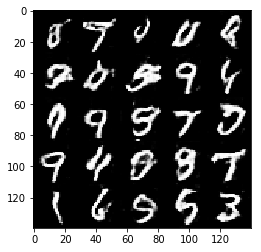

Epoch 2/2 Step 3750... Discriminator Loss: 0.7675... Generator Loss: 1.3586


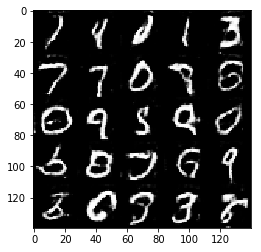

In [20]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1 Step 50... Discriminator Loss: 1.0089... Generator Loss: 1.2637


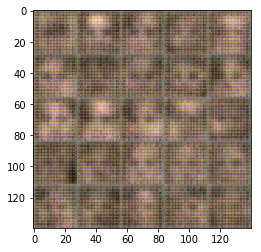

Epoch 1/1 Step 100... Discriminator Loss: 1.4844... Generator Loss: 0.4953


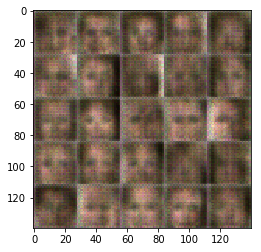

Epoch 1/1 Step 150... Discriminator Loss: 1.4952... Generator Loss: 2.0778


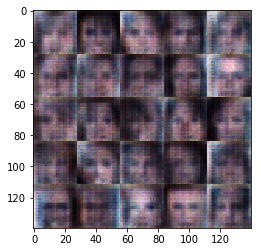

Epoch 1/1 Step 200... Discriminator Loss: 1.1657... Generator Loss: 0.8393


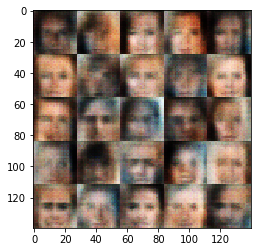

Epoch 1/1 Step 250... Discriminator Loss: 0.9454... Generator Loss: 2.4306


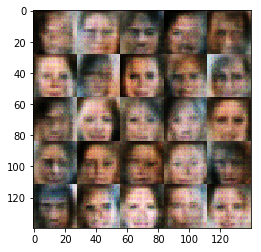

Epoch 1/1 Step 300... Discriminator Loss: 2.1035... Generator Loss: 3.5923


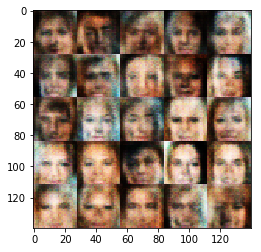

Epoch 1/1 Step 350... Discriminator Loss: 1.1995... Generator Loss: 0.6564


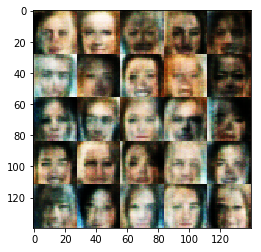

Epoch 1/1 Step 400... Discriminator Loss: 0.9339... Generator Loss: 2.0509


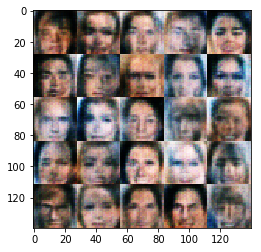

Epoch 1/1 Step 450... Discriminator Loss: 0.7459... Generator Loss: 1.9012


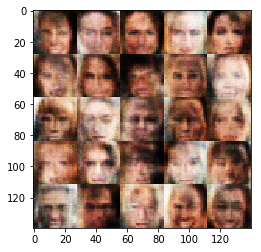

Epoch 1/1 Step 500... Discriminator Loss: 0.7211... Generator Loss: 1.4993


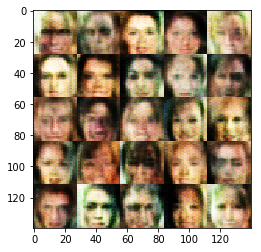

Epoch 1/1 Step 550... Discriminator Loss: 1.2153... Generator Loss: 4.1032


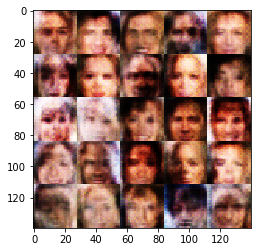

Epoch 1/1 Step 600... Discriminator Loss: 0.5092... Generator Loss: 3.5723


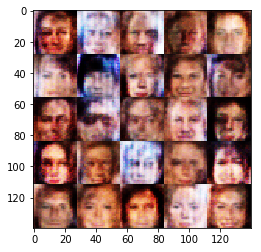

Epoch 1/1 Step 650... Discriminator Loss: 0.6406... Generator Loss: 1.9162


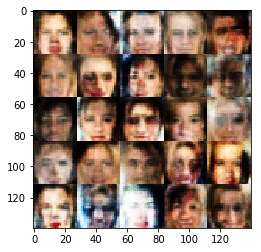

Epoch 1/1 Step 700... Discriminator Loss: 0.7494... Generator Loss: 1.4780


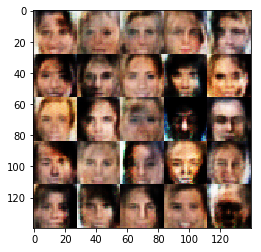

Epoch 1/1 Step 750... Discriminator Loss: 2.2136... Generator Loss: 6.4764


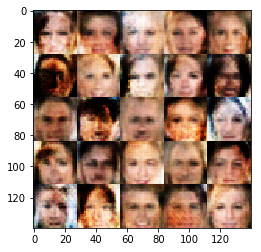

Epoch 1/1 Step 800... Discriminator Loss: 0.7252... Generator Loss: 1.4064


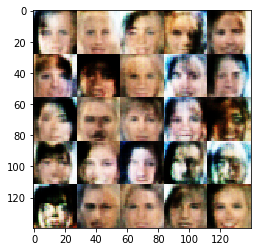

Epoch 1/1 Step 850... Discriminator Loss: 0.5005... Generator Loss: 2.9038


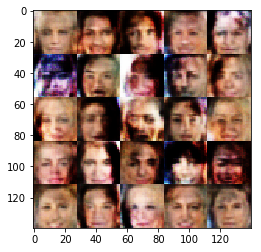

Epoch 1/1 Step 900... Discriminator Loss: 0.6973... Generator Loss: 4.9492


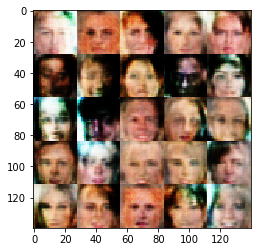

Epoch 1/1 Step 950... Discriminator Loss: 0.5070... Generator Loss: 3.8188


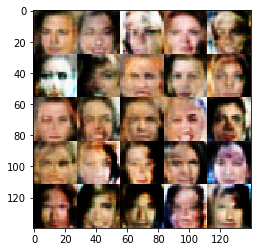

Epoch 1/1 Step 1000... Discriminator Loss: 0.5290... Generator Loss: 2.6738


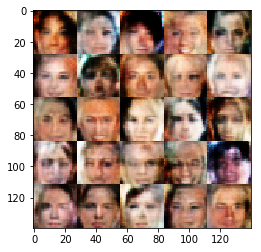

Epoch 1/1 Step 1050... Discriminator Loss: 0.6993... Generator Loss: 4.2425


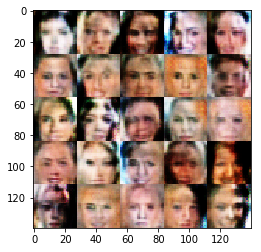

Epoch 1/1 Step 1100... Discriminator Loss: 0.6291... Generator Loss: 4.6416


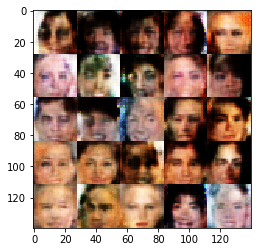

Epoch 1/1 Step 1150... Discriminator Loss: 1.0214... Generator Loss: 0.8501


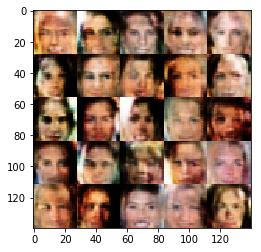

Epoch 1/1 Step 1200... Discriminator Loss: 0.4809... Generator Loss: 4.3014


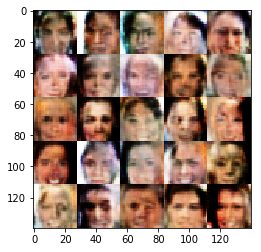

Epoch 1/1 Step 1250... Discriminator Loss: 1.2714... Generator Loss: 0.5851


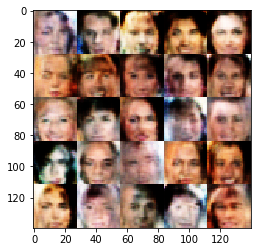

Epoch 1/1 Step 1300... Discriminator Loss: 0.4473... Generator Loss: 2.9578


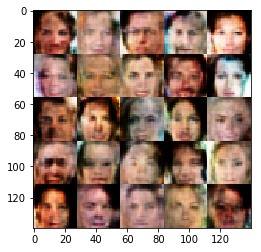

Epoch 1/1 Step 1350... Discriminator Loss: 1.3153... Generator Loss: 0.6164


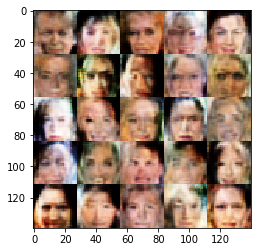

Epoch 1/1 Step 1400... Discriminator Loss: 0.7742... Generator Loss: 3.0814


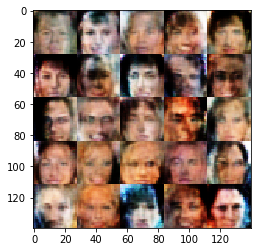

Epoch 1/1 Step 1450... Discriminator Loss: 0.6250... Generator Loss: 2.0511


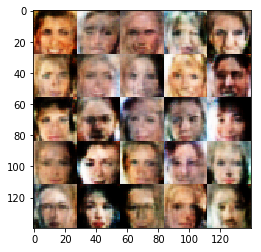

Epoch 1/1 Step 1500... Discriminator Loss: 0.4700... Generator Loss: 2.8931


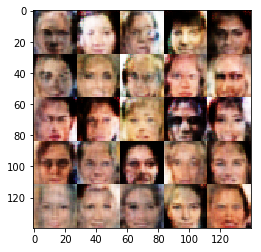

Epoch 1/1 Step 1550... Discriminator Loss: 1.0448... Generator Loss: 0.9089


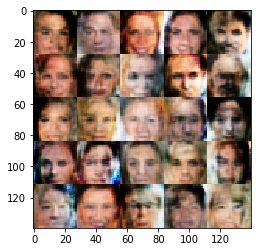

Epoch 1/1 Step 1600... Discriminator Loss: 1.0448... Generator Loss: 1.0327


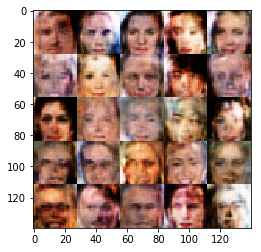

Epoch 1/1 Step 1650... Discriminator Loss: 2.1041... Generator Loss: 0.3298


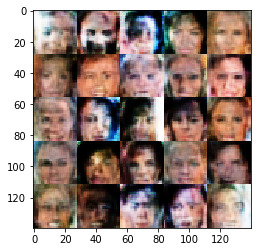

Epoch 1/1 Step 1700... Discriminator Loss: 0.4433... Generator Loss: 3.3027


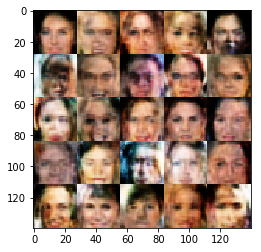

Epoch 1/1 Step 1750... Discriminator Loss: 0.8806... Generator Loss: 2.6812


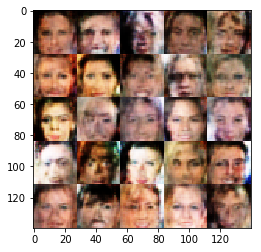

Epoch 1/1 Step 1800... Discriminator Loss: 0.9284... Generator Loss: 1.1426


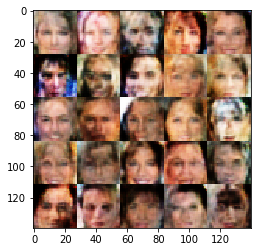

Epoch 1/1 Step 1850... Discriminator Loss: 0.4958... Generator Loss: 2.9432


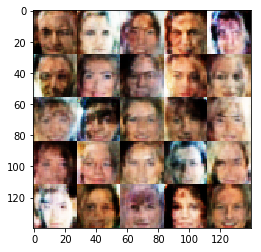

Epoch 1/1 Step 1900... Discriminator Loss: 0.6843... Generator Loss: 2.0422


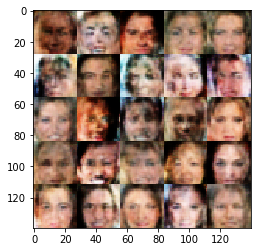

Epoch 1/1 Step 1950... Discriminator Loss: 0.6968... Generator Loss: 2.7676


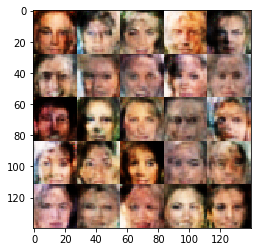

Epoch 1/1 Step 2000... Discriminator Loss: 0.4122... Generator Loss: 3.5729


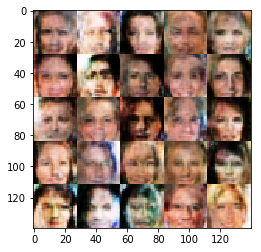

Epoch 1/1 Step 2050... Discriminator Loss: 0.5595... Generator Loss: 2.4232


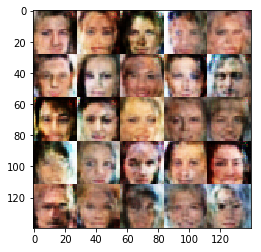

Epoch 1/1 Step 2100... Discriminator Loss: 0.9266... Generator Loss: 1.0475


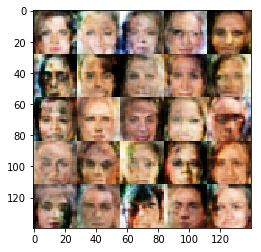

Epoch 1/1 Step 2150... Discriminator Loss: 1.4240... Generator Loss: 4.0421


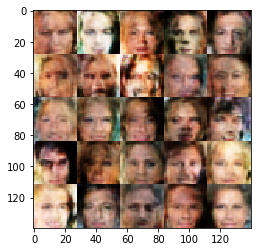

Epoch 1/1 Step 2200... Discriminator Loss: 0.7347... Generator Loss: 1.5197


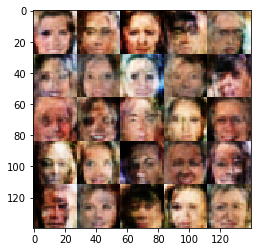

Epoch 1/1 Step 2250... Discriminator Loss: 0.7345... Generator Loss: 1.5511


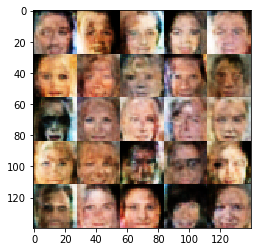

Epoch 1/1 Step 2300... Discriminator Loss: 1.2404... Generator Loss: 0.6843


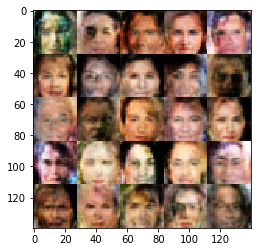

Epoch 1/1 Step 2350... Discriminator Loss: 0.5529... Generator Loss: 2.4930


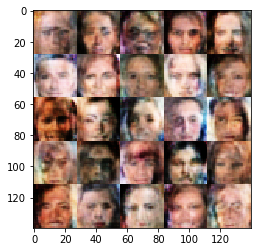

Epoch 1/1 Step 2400... Discriminator Loss: 0.5304... Generator Loss: 2.4155


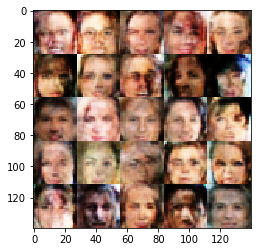

Epoch 1/1 Step 2450... Discriminator Loss: 0.3951... Generator Loss: 3.9624


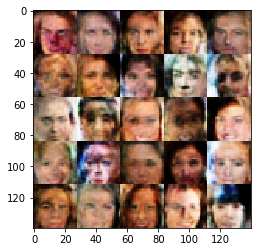

Epoch 1/1 Step 2500... Discriminator Loss: 3.1766... Generator Loss: 0.1050


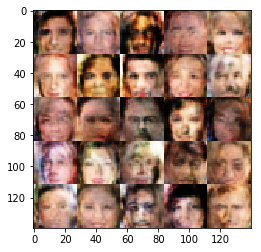

Epoch 1/1 Step 2550... Discriminator Loss: 0.8497... Generator Loss: 1.3051


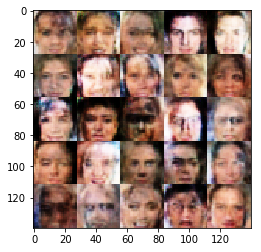

Epoch 1/1 Step 2600... Discriminator Loss: 1.3025... Generator Loss: 0.6806


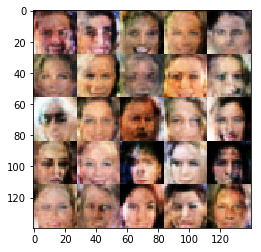

Epoch 1/1 Step 2650... Discriminator Loss: 1.4111... Generator Loss: 1.5481


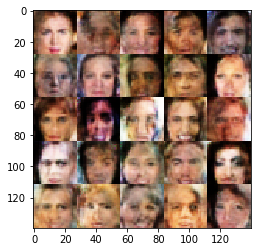

Epoch 1/1 Step 2700... Discriminator Loss: 0.5990... Generator Loss: 2.3642


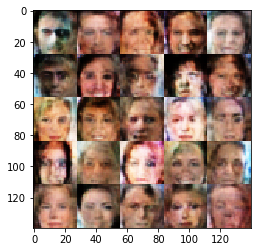

Epoch 1/1 Step 2750... Discriminator Loss: 0.6866... Generator Loss: 2.0341


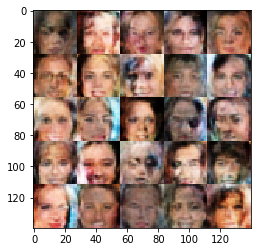

Epoch 1/1 Step 2800... Discriminator Loss: 0.7652... Generator Loss: 1.3105


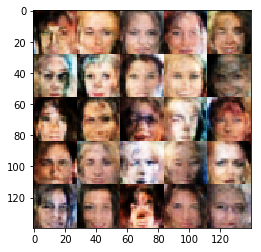

Epoch 1/1 Step 2850... Discriminator Loss: 0.8625... Generator Loss: 1.2978


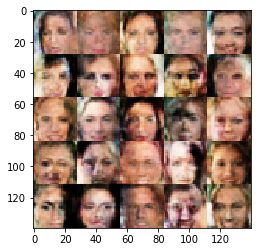

Epoch 1/1 Step 2900... Discriminator Loss: 0.5688... Generator Loss: 2.9645


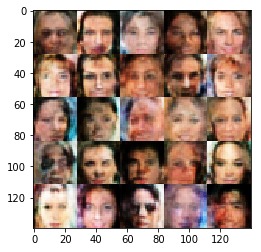

Epoch 1/1 Step 2950... Discriminator Loss: 0.5761... Generator Loss: 2.5359


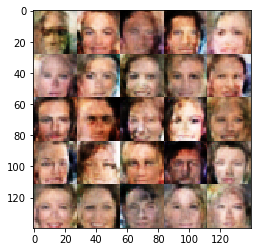

Epoch 1/1 Step 3000... Discriminator Loss: 1.2890... Generator Loss: 2.1368


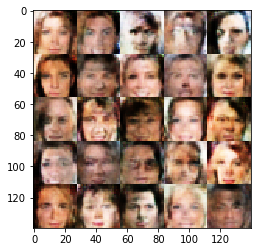

Epoch 1/1 Step 3050... Discriminator Loss: 0.7198... Generator Loss: 1.5757


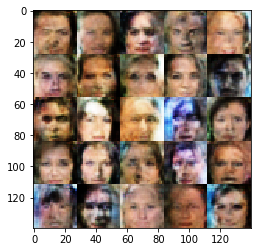

Epoch 1/1 Step 3100... Discriminator Loss: 1.0889... Generator Loss: 0.8087


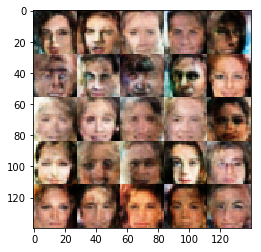

Epoch 1/1 Step 3150... Discriminator Loss: 0.6919... Generator Loss: 2.3053


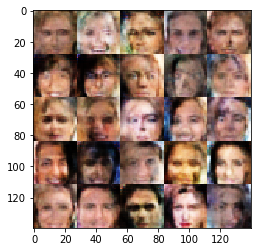

Epoch 1/1 Step 3200... Discriminator Loss: 0.8553... Generator Loss: 1.6577


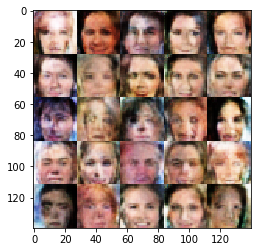

Epoch 1/1 Step 3250... Discriminator Loss: 0.6027... Generator Loss: 1.9853


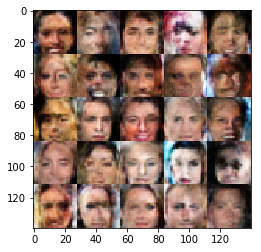

Epoch 1/1 Step 3300... Discriminator Loss: 0.5895... Generator Loss: 3.1643


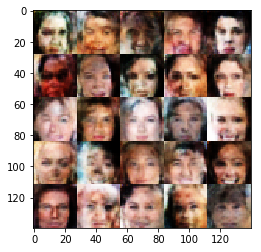

Epoch 1/1 Step 3350... Discriminator Loss: 1.0098... Generator Loss: 1.0603


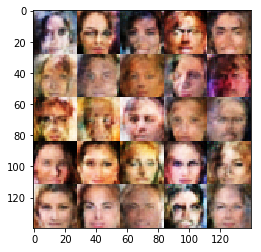

Epoch 1/1 Step 3400... Discriminator Loss: 0.6183... Generator Loss: 2.1934


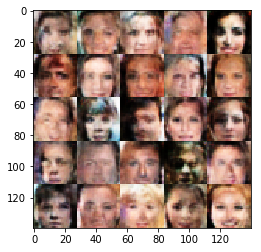

Epoch 1/1 Step 3450... Discriminator Loss: 0.7601... Generator Loss: 1.5254


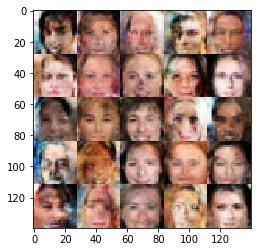

Epoch 1/1 Step 3500... Discriminator Loss: 0.7187... Generator Loss: 1.6079


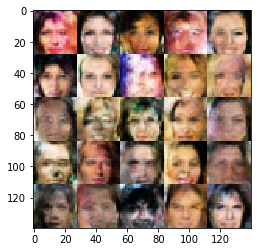

Epoch 1/1 Step 3550... Discriminator Loss: 0.6038... Generator Loss: 2.1296


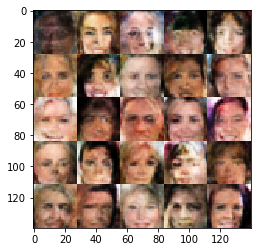

Epoch 1/1 Step 3600... Discriminator Loss: 0.6245... Generator Loss: 3.5639


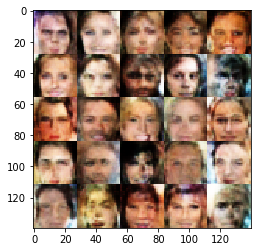

Epoch 1/1 Step 3650... Discriminator Loss: 0.5915... Generator Loss: 2.3797


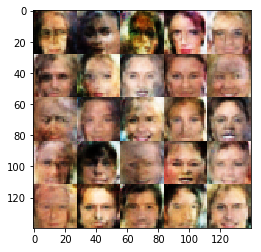

Epoch 1/1 Step 3700... Discriminator Loss: 0.5725... Generator Loss: 2.0285


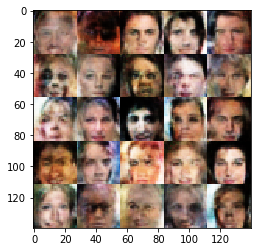

Epoch 1/1 Step 3750... Discriminator Loss: 0.4657... Generator Loss: 2.8424


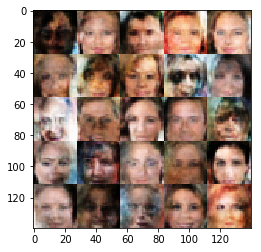

Epoch 1/1 Step 3800... Discriminator Loss: 0.7290... Generator Loss: 1.3467


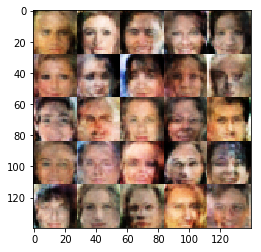

Epoch 1/1 Step 3850... Discriminator Loss: 0.5346... Generator Loss: 3.2868


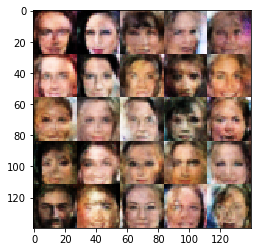

Epoch 1/1 Step 3900... Discriminator Loss: 0.7419... Generator Loss: 1.9821


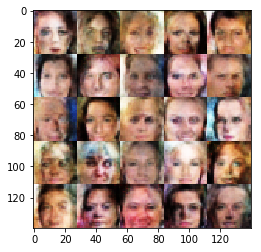

Epoch 1/1 Step 3950... Discriminator Loss: 0.8655... Generator Loss: 1.1239


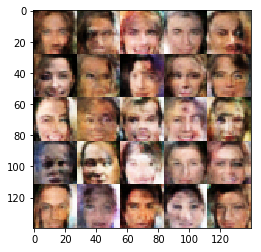

Epoch 1/1 Step 4000... Discriminator Loss: 0.9826... Generator Loss: 1.6796


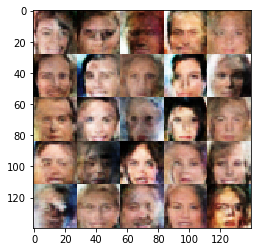

Epoch 1/1 Step 4050... Discriminator Loss: 0.5124... Generator Loss: 2.5286


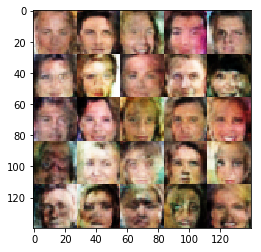

Epoch 1/1 Step 4100... Discriminator Loss: 0.8487... Generator Loss: 1.9346


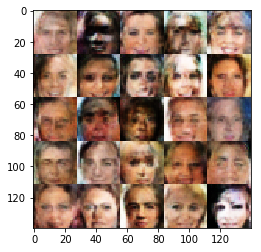

Epoch 1/1 Step 4150... Discriminator Loss: 0.8367... Generator Loss: 1.2173


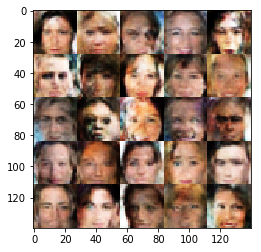

Epoch 1/1 Step 4200... Discriminator Loss: 0.5237... Generator Loss: 2.2731


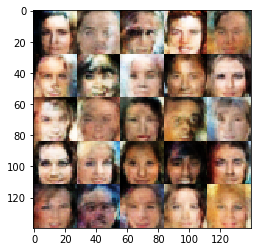

Epoch 1/1 Step 4250... Discriminator Loss: 0.6053... Generator Loss: 1.8912


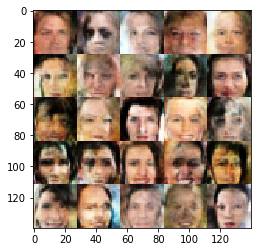

Epoch 1/1 Step 4300... Discriminator Loss: 0.8168... Generator Loss: 1.2329


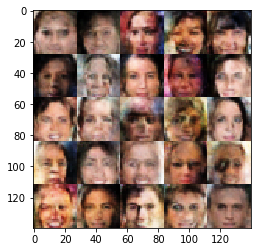

Epoch 1/1 Step 4350... Discriminator Loss: 0.6782... Generator Loss: 2.5962


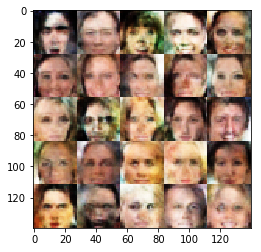

Epoch 1/1 Step 4400... Discriminator Loss: 1.0159... Generator Loss: 0.9108


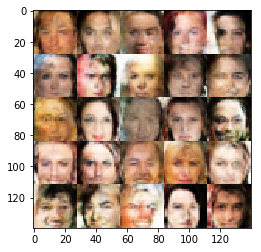

Epoch 1/1 Step 4450... Discriminator Loss: 0.5832... Generator Loss: 1.8537


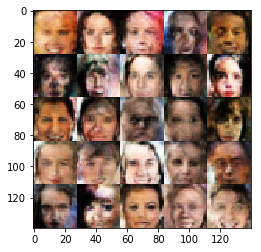

Epoch 1/1 Step 4500... Discriminator Loss: 0.6189... Generator Loss: 1.8670


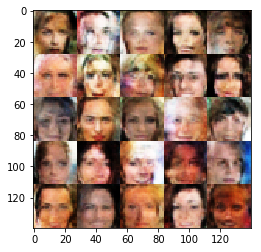

Epoch 1/1 Step 4550... Discriminator Loss: 0.7910... Generator Loss: 1.3015


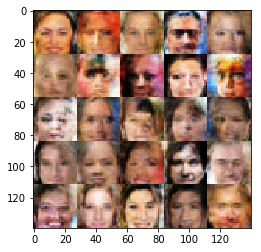

Epoch 1/1 Step 4600... Discriminator Loss: 0.5641... Generator Loss: 2.1411


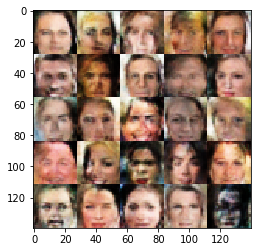

Epoch 1/1 Step 4650... Discriminator Loss: 2.0781... Generator Loss: 0.3397


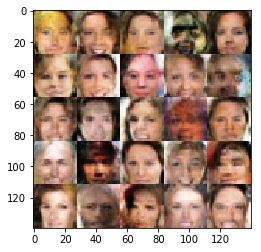

Epoch 1/1 Step 4700... Discriminator Loss: 0.8695... Generator Loss: 1.0739


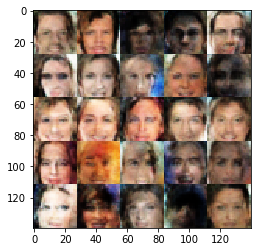

Epoch 1/1 Step 4750... Discriminator Loss: 0.6159... Generator Loss: 2.3036


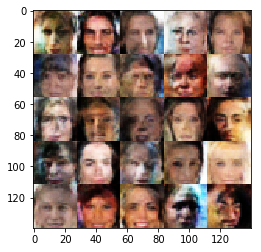

Epoch 1/1 Step 4800... Discriminator Loss: 0.6313... Generator Loss: 1.8513


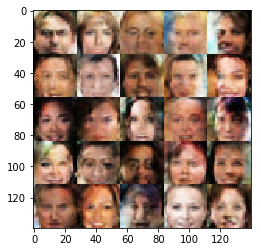

Epoch 1/1 Step 4850... Discriminator Loss: 0.6837... Generator Loss: 1.5041


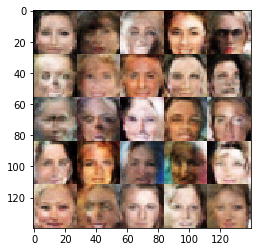

Epoch 1/1 Step 4900... Discriminator Loss: 1.6242... Generator Loss: 2.5810


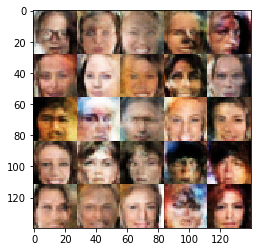

Epoch 1/1 Step 4950... Discriminator Loss: 0.6418... Generator Loss: 2.5929


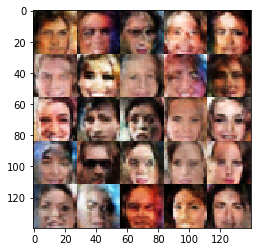

Epoch 1/1 Step 5000... Discriminator Loss: 0.6338... Generator Loss: 1.7759


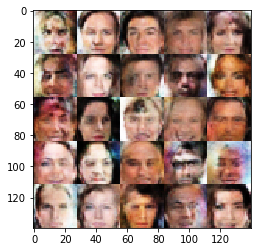

Epoch 1/1 Step 5050... Discriminator Loss: 0.5256... Generator Loss: 2.6098


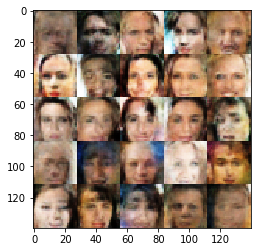

Epoch 1/1 Step 5100... Discriminator Loss: 1.0109... Generator Loss: 2.7956


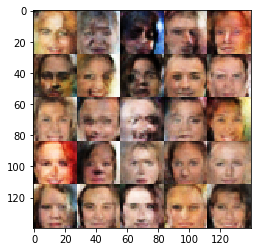

Epoch 1/1 Step 5150... Discriminator Loss: 0.6053... Generator Loss: 1.8658


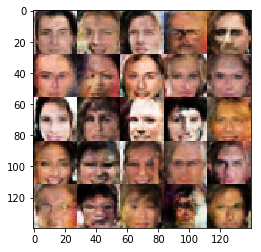

Epoch 1/1 Step 5200... Discriminator Loss: 1.0535... Generator Loss: 0.9299


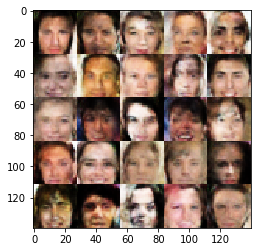

Epoch 1/1 Step 5250... Discriminator Loss: 0.6182... Generator Loss: 3.4505


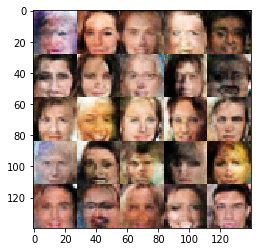

Epoch 1/1 Step 5300... Discriminator Loss: 1.5348... Generator Loss: 0.5953


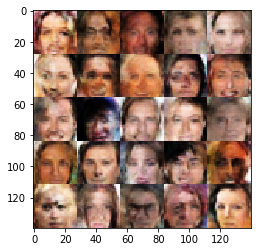

Epoch 1/1 Step 5350... Discriminator Loss: 0.6738... Generator Loss: 2.4125


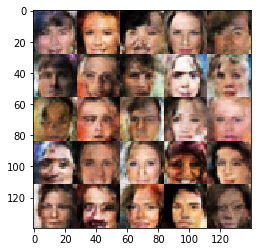

Epoch 1/1 Step 5400... Discriminator Loss: 0.7715... Generator Loss: 2.1581


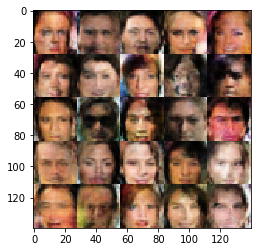

Epoch 1/1 Step 5450... Discriminator Loss: 1.2528... Generator Loss: 0.6183


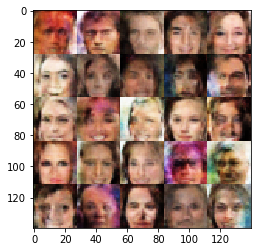

Epoch 1/1 Step 5500... Discriminator Loss: 0.5963... Generator Loss: 1.8936


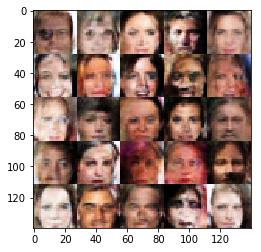

Epoch 1/1 Step 5550... Discriminator Loss: 2.0939... Generator Loss: 0.3172


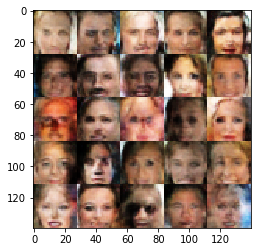

Epoch 1/1 Step 5600... Discriminator Loss: 0.4816... Generator Loss: 2.5683


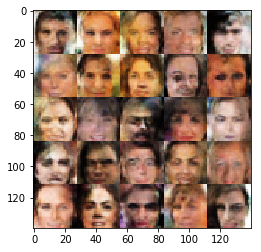

Epoch 1/1 Step 5650... Discriminator Loss: 0.6883... Generator Loss: 1.5934


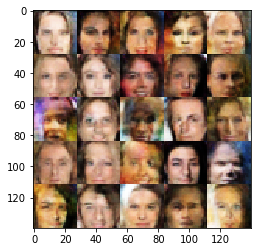

Epoch 1/1 Step 5700... Discriminator Loss: 0.5993... Generator Loss: 1.8457


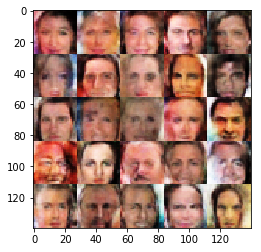

Epoch 1/1 Step 5750... Discriminator Loss: 0.7817... Generator Loss: 1.4768


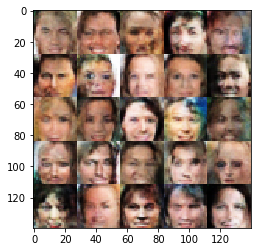

Epoch 1/1 Step 5800... Discriminator Loss: 1.6944... Generator Loss: 0.5231


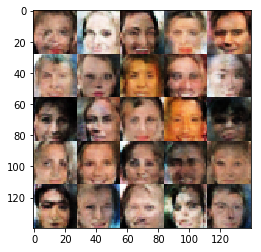

Epoch 1/1 Step 5850... Discriminator Loss: 0.6508... Generator Loss: 1.8451


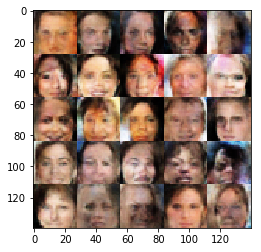

Epoch 1/1 Step 5900... Discriminator Loss: 0.6308... Generator Loss: 1.8212


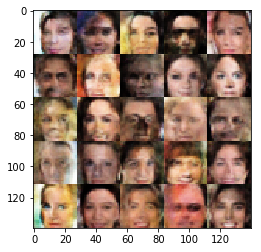

Epoch 1/1 Step 5950... Discriminator Loss: 0.6311... Generator Loss: 1.6507


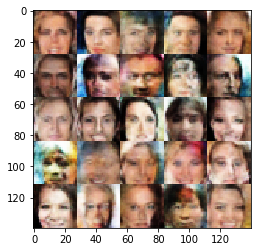

Epoch 1/1 Step 6000... Discriminator Loss: 0.7985... Generator Loss: 2.0790


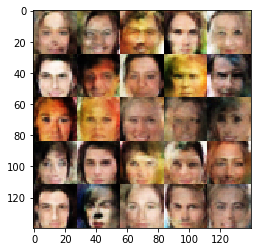

Epoch 1/1 Step 6050... Discriminator Loss: 2.2596... Generator Loss: 0.3366


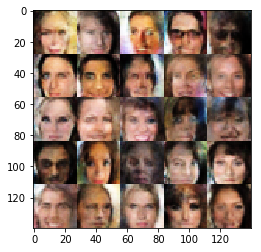

Epoch 1/1 Step 6100... Discriminator Loss: 1.0143... Generator Loss: 0.9295


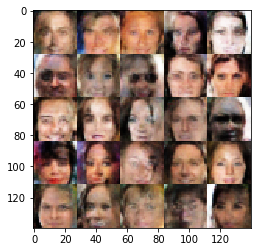

Epoch 1/1 Step 6150... Discriminator Loss: 0.5720... Generator Loss: 2.4512


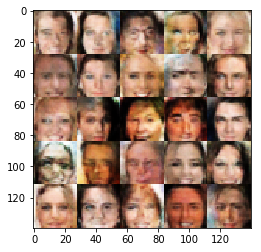

Epoch 1/1 Step 6200... Discriminator Loss: 0.7822... Generator Loss: 1.4146


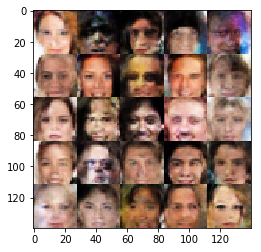

Epoch 1/1 Step 6250... Discriminator Loss: 0.7039... Generator Loss: 1.3871


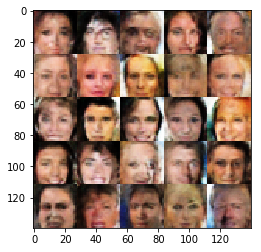

Epoch 1/1 Step 6300... Discriminator Loss: 0.7154... Generator Loss: 1.7090


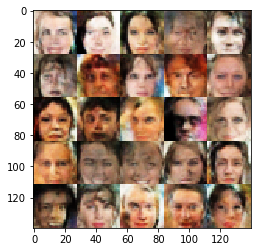

In [21]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。